# <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">استخراج تعاملی پیش‌زمینه با استفاده از الگوریتم GrabCut</div>

<div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">
این الگوریتم توسط محققان Microsoft Research  در کمبریج انگلستان توسعه داده شده است.
    <br/>
این گروه در مقاله‌ی
</div>

["GrabCut": interactive foreground extraction using iterated graph cuts](https://dl.acm.org/citation.cfm?id=1015720_)

<div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">
روشی برای جداکردن تصویر پیش‌زمینه یا شئ از تصویر پس‌زمینه را با حداقل دخالت کاربر ارائه دادند.
<br/>
در واقع میتوان گفت این یک الگوریتم سگمنت کردن تعاملی است.
</div>

### <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">در ابتدا باید ناحیه ای که تصویر در آن وجود دارد را با یک مستطیل مشخص کنید!</div>

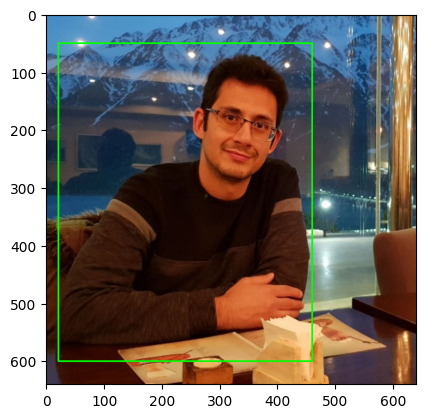

In [2]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

img = cv2.imread('images/akhavan.jpg')
rect = (21,50,460,600)
cv2.rectangle(img, (rect[0], rect[1]), (rect[2], rect[3]), (0,255,0), 2)
plt.imshow(img[...,::-1])

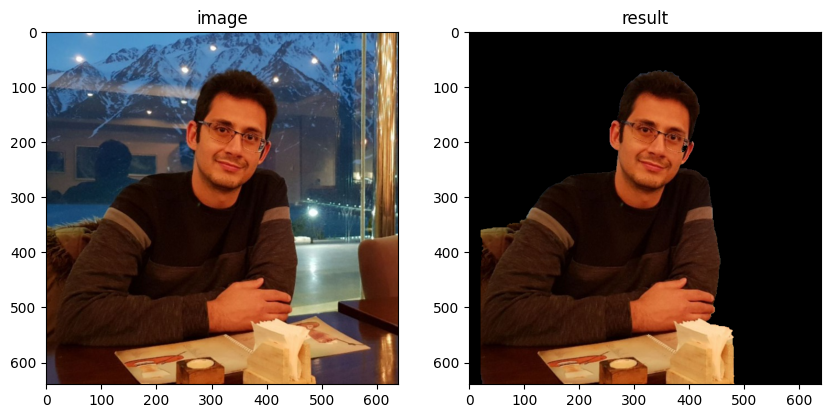

In [19]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

img = cv2.imread('images/akhavan.jpg')
msk = np.zeros(img.shape[:2],np.uint8)

# its always must be this 
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)

# your area that have to segment
rect = (21,50,460,600)
cv2.grabCut(img,msk,rect,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_RECT)
msk2 = np.where((msk==0)|(msk==2),0,1).astype(np.uint8)
result = img*msk2[:,:,np.newaxis]

plt.figure(figsize=[10,5])
plt.subplot(121);plt.imshow(img[...,::-1]);plt.title("image");
plt.subplot(122);plt.imshow(result[...,::-1]);plt.title("result");

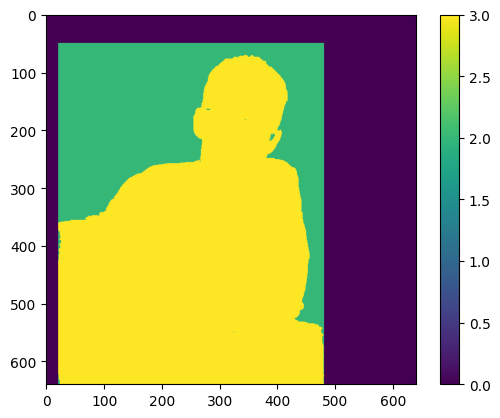

In [20]:
plt.imshow(msk),plt.colorbar(),plt.show();

In [21]:
np.unique(msk)

array([0, 2, 3], dtype=uint8)

`cv2.GC_BGD` or `0` defines an **obvious background** pixels.

`cv2.GC_FGD` or `1` defines an **obvious foreground (object)** pixel.

`cv2.GC_PR_BGD` or `2` defines a **possible background** pixel.

`cv2.GC_PR_FGD` or `3` defines a **possible foreground** pixel.

### <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">تعامل بیشتر کاربر</div>

<div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">با تعامل بیشتر نواحی قطعا پس‌زمینه یا نواحی قطعا پیش‌زمینه را مشخص میکنیم و الگوریتم را مجدد اجرا می‌کنیم:</div>

## help to algoritm

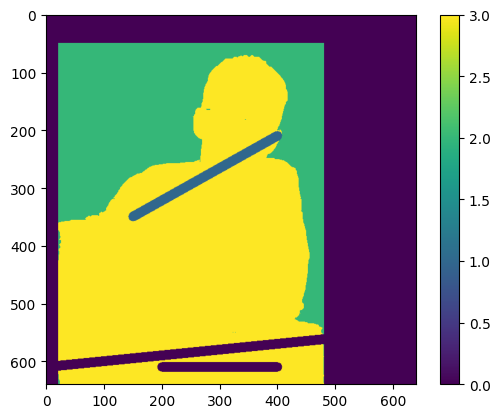

In [22]:
cv2.line(msk, (0,610), (600,550), cv2.GC_BGD, 15)
cv2.line(msk, (200,610), (400,610), cv2.GC_BGD, 15)
cv2.line(msk, (150,350), (400,210), cv2.GC_FGD, 15)
plt.imshow(msk),plt.colorbar(),plt.show();

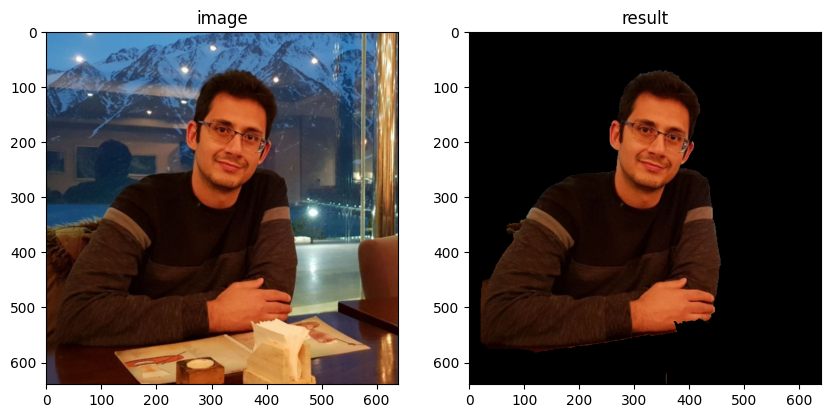

In [23]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

img = cv2.imread('images/akhavan.jpg')
bgdmodel = np.zeros((1, 65), np.float64)
fgdmodel = np.zeros((1, 65), np.float64)
cv2.grabCut(img,msk,None,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_MASK)

mask2 = np.where((msk==cv2.GC_PR_BGD)|(msk==cv2.GC_BGD),0,1).astype('uint8')
result = img*mask2[:,:,np.newaxis]

plt.figure(figsize=[10,5])
plt.subplot(121);plt.imshow(img[...,::-1]);plt.title("image");
plt.subplot(122);plt.imshow(result[...,::-1]);plt.title("result");

## simpler

### <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">برنامه کاربردی حذف پس‌زمینه!</div>

<div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">در این برنامه تعاملی، ابتدا باید ناحیه ای  شئ در آن حضور دارد را با کلیک‌راست و رسم مستطیلی مشخص کنید.
<br/>
سپس با زدن کلیدهای 0 و 1 به ترتیب برای نواحی که مطمئن هستیم پس‌زمینه(شئ) و پیش‌زمینه(background) هستند و رسم نواحی با کلیک چپ به الگوریتم در نواحی‌ای که احتمال میدهیم اشتباه کند کمک کنیم!
<br/>
در هر لحظه برای مشاهده‌ی خروجی و اعمال الگوریتم کلید n را از روی کیبورد بفشارید.</div>

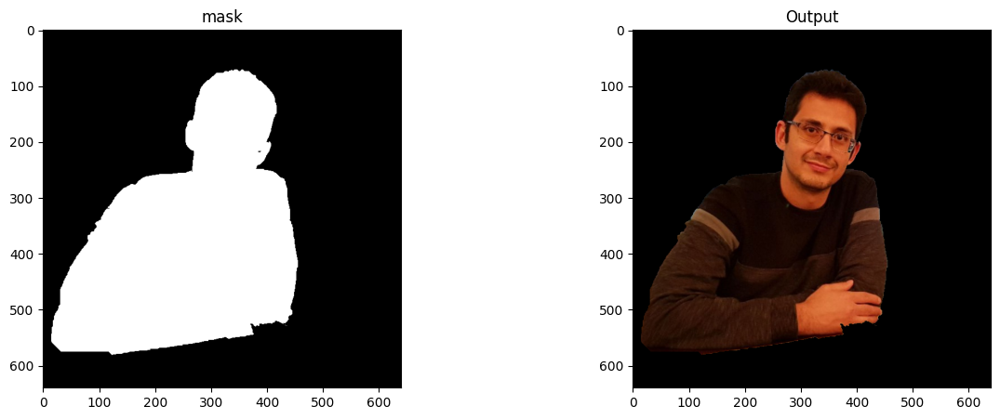

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

draw_rectangle = False
drawing = False
rect_or_mask = -1
rect_is_drawed = False

def onmouse(event, x, y, flags, param):
    # Draw Rectangle
    global draw_rectangle, start_point, rect, drawing, rect_or_mask, draw_image, rect_is_drawed
    if event == cv2.EVENT_RBUTTONDOWN:
        draw_rectangle = True
        start_point = (x, y)

    elif event == cv2.EVENT_MOUSEMOVE:
        if draw_rectangle:
            draw_image = image.copy()
            cv2.rectangle(draw_image, start_point, (x, y), (255,0,0), 2)

    elif event == cv2.EVENT_RBUTTONUP:
        draw_rectangle = False
        cv2.rectangle(draw_image, start_point, (x, y), (255,0,0), 2)
        rect = (min(start_point[0], x), min(start_point[1], y), abs(start_point[0] - x), abs(start_point[1] - y))
        rect_is_drawed = True
        rect_or_mask = 0
    # draw touchup curves
    if event == cv2.EVENT_LBUTTONDOWN:
        if not rect_is_drawed:
            print("first draw rectangle \n")
        else:
            drawing = True
            cv2.circle(draw_image, (x,y), 3, value['color'], -1)
            cv2.circle(mask, (x,y), 3, value['val'], -1)

    elif event == cv2.EVENT_MOUSEMOVE:
        if drawing == True:
            cv2.circle(draw_image, (x, y), 3, value['color'], -1)
            cv2.circle(mask, (x, y), 3, value['val'], -1)

    elif event == cv2.EVENT_LBUTTONUP:
        if drawing == True:
            drawing = False

image = cv2.imread('images/akhavan.jpg')
draw_image = image.copy()                               # a copy of original image
mask = np.zeros(image.shape[:2], dtype = np.uint8)      # mask initialized to PR_BG
output = np.zeros(image.shape, np.uint8)                # output image to be shown

# input and output windows
cv2.namedWindow('output')
cv2.namedWindow('input')
cv2.setMouseCallback('input', onmouse)

DRAW_BG = {'color' : (0,0,0), 'val' : 0}
DRAW_FG = {'color' : (255,255,255), 'val' : 1}

while True:

    cv2.imshow('output', output)
    cv2.imshow('input', draw_image)
    k = cv2.waitKey(1)
    # key bindings
    if k == 27:         # esc to exit
        break
    elif k == ord('0'): # BG drawing
        value = DRAW_BG
    elif k == ord('1'): # FG drawing
        value = DRAW_FG
    elif k == ord('n'): # segment the image
        bgdmodel = np.zeros((1, 65), np.float64)
        fgdmodel = np.zeros((1, 65), np.float64)
        if rect_or_mask == 0:         # grabcut with rect
            cv2.grabCut(image, mask, rect, bgdmodel, fgdmodel, 1, cv2.GC_INIT_WITH_RECT)
            rect_or_mask = 1
        elif rect_or_mask == 1:       # grabcut with mask
            cv2.grabCut(image, mask, rect, bgdmodel, fgdmodel, 1, cv2.GC_INIT_WITH_MASK)


    mask2 = np.where((mask==1) + (mask==3), 255, 0).astype('uint8')
    output = cv2.bitwise_and(image, image, mask=mask2)

cv2.destroyAllWindows()
cv2.imwrite('images/grabcut_output.png', output)

plt.figure(figsize=[15,5])
plt.subplot(121);plt.imshow(mask2, cmap='gray');plt.title("mask");
plt.subplot(122);plt.imshow(output[...,::-1]);plt.title("Output");

# classification with machine learning

<center><div style="direction:rtl;font-family:B Lotus, B Nazanin, Tahoma">به نام خدا</div></center>
<h1><center><div style="direction:rtl;font-family:B Lotus, B Nazanin, Tahoma">معرفی مجموعه داده هدی و تغییر اندازه و شکل برای استفاده در الگوریتم‌های یادگیری ماشین</div></center></h1>

## <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">معرفی مجموعه داده ارقام دستنویس هدی</div>

<div style="direction:rtl;text-align:right;font-family:Tahoma">
مجموعه ارقام دستنویس هدی که اولین مجموعه‌ی بزرگ ارقام دستنویس فارسی است، مشتمل بر ۱۰۲۳۵۳ نمونه دستنوشته سیاه سفید است. این مجموعه طی انجام یک پروژه‏ی کارشناسی ارشد درباره بازشناسی فرمهای دستنویس تهیه شده است. داده های این مجموعه از حدود ۱۲۰۰۰ فرم ثبت نام آزمون سراسری کارشناسی ارشد سال ۱۳۸۴ و آزمون کاردانی پیوسته‏ی دانشگاه جامع علمی کاربردی سال ۱۳۸۳ استخراج شده است[1].
</div>
<p>
<a href="https://www.sciencedirect.com/science/article/pii/S0167865507000037" target="_blank">
H. Khosravi and E. Kabir, "Introducing a very large dataset of handwritten Farsi digits and a study on their varieties," Pattern Recognition Letters, vol. 28, pp. 1133-1141, 2007. ]
</a>    
</p>

## <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">لود کتابخانه‌های مورد استفاده</div>
<div style="direction:rtl;text-align:right;font-family:Tahoma">
برای اجرای این نوت‌بوک باید کتابخانه‌های  numpy و scipy و matplotlib و opencv-python را نصب کنید.
بدین منظور به اینترنت متصل شود و در cmd  دستورات زیر را بنویسید:
</div>
<p>pip install numpy</p>
<p>pip install scipy</p>
<p>pip install matplotlib</p>
<p>pip install opencv-python</p>

<div style="direction:rtl;text-align:right;font-family:Tahoma">
میتوانید به جای pip از کلمه ی conda استفاده کنید. (اگر از آناکوندا استفاده میکنید.)
</div>

In [1]:
import numpy as np
from scipy import io
import matplotlib.pyplot as plt
import cv2

## <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">لود مجموعه داده (dataset)</div>
<div style="direction:rtl;text-align:right;font-family:Tahoma">
این مجموعه داده در قالب فایل mat متلب منتشر شده است. در پایتون میتوانیم آن را با کتابخانه scipy لود کنیم.
</div>


In [2]:
dataset = io.loadmat("dataset/Data_hoda_full.mat")

## <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">انتخاب مجموعه داده آموزش و مجموعه داده آزمون(تست)</div>
<div style="direction:rtl;text-align:right;font-family:Tahoma">
در این مجموعه داده 60000 داده تصادفی وجود دارد.
<br>
برای آزمایشاتمان 1000 داده‌ی اول را برای آموزش و 200 داده‌ی بعدی را برای آزمون انتخاب می‌کنیم.
<br>
**داده های آزمون نباید قبلا در داده های آموزشی دیده شده باشند.**
</div>

In [3]:
type(dataset)

dict

In [4]:
dataset.keys()

dict_keys(['__header__', '__version__', '__globals__', 'Data', 'labels'])

In [5]:
dataset["Data"]

array([[array([[  0,   0,   0,   0, 255, 255,   0,   0,   0,   0,   0,   0,   0,
                  0,   0,   0,   0,   0,   0,   0],
               [  0,   0,   0, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,
                  0,   0,   0,   0,   0,   0,   0],
               [  0,   0, 255, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,
                  0,   0,   0,   0, 255, 255,   0],
               [  0, 255, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,
                  0,   0,   0, 255, 255, 255, 255],
               [  0, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,
                  0,   0, 255, 255, 255, 255,   0],
               [  0, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,   0,
                  0, 255, 255, 255, 255, 255,   0],
               [255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,   0,
                255, 255, 255, 255, 255,   0,   0],
               [255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0

## remove label

In [6]:
np.squeeze(dataset["Data"]).shape

(60000,)

In [7]:
len(np.squeeze(dataset["Data"]))

60000

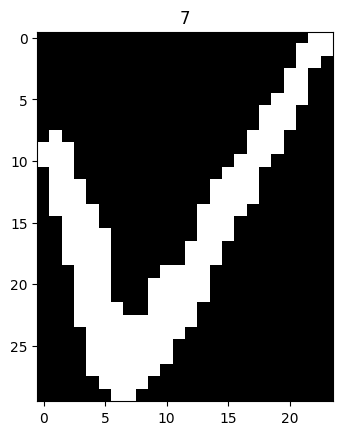

In [8]:
plt.imshow(np.squeeze(dataset["Data"])[50],cmap="gray")
plt.title(np.squeeze(dataset["labels"])[50]);

## train and test

## <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">انتخاب مجموعه داده آموزش و مجموعه داده آزمون(تست)</div>
<div style="direction:rtl;text-align:right;font-family:Tahoma">
در این مجموعه داده 60000 داده تصادفی وجود دارد.
<br>
برای آزمایشاتمان 1000 داده‌ی اول را برای آموزش و 200 داده‌ی بعدی را برای آزمون انتخاب می‌کنیم.
<br>
**داده های آزمون نباید قبلا در داده های آموزشی دیده شده باشند.**
</div>

In [9]:
x_train = np.squeeze(dataset["Data"][:1000])
y_train = np.squeeze(dataset["labels"][:1000])
x_test = np.squeeze(dataset["Data"][1000:1200])
y_test = np.squeeze(dataset["labels"][1000:1200])

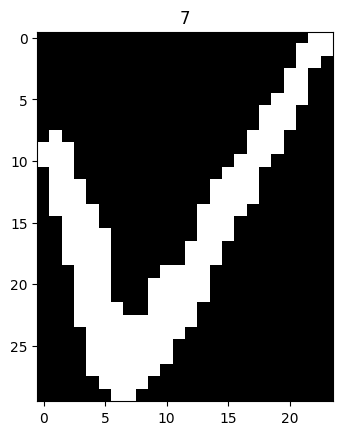

In [10]:
i=50
plt.imshow(x_train[i], cmap='gray')
plt.title(y_train[i])
plt.show()

In [11]:
x_train_resize = [cv2.resize(img,dsize=(5,5)) for img in x_train] 
x_test_resize = [cv2.resize(img,dsize=(5,5)) for img in x_test] 

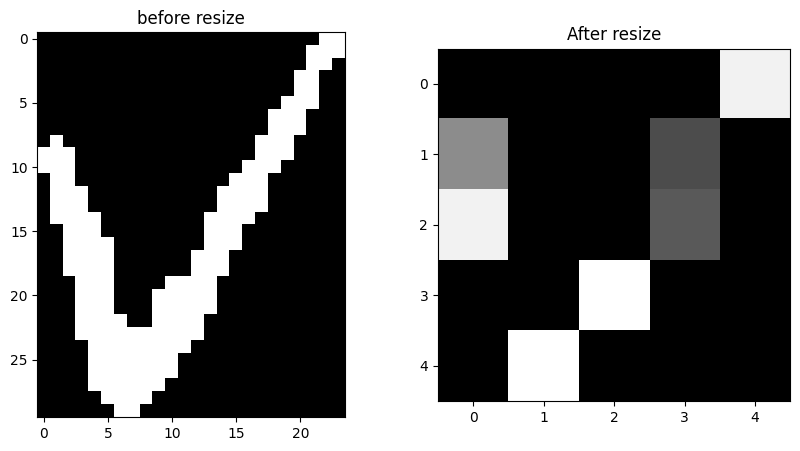

In [12]:
i=50
plt.figure(figsize=[10,5])
plt.subplot(121);plt.imshow(x_train[i], cmap='gray');plt.title("before resize");
plt.subplot(122);plt.imshow(x_train_resize[i], cmap='gray');plt.title("After resize");

## reshap

## <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">تغییر شکل مجموعه داده</div>


In [13]:
#reshape
X_train = np.reshape(x_train_resize, [-1,25])
X_test = np.reshape(x_test_resize, [-1,25])

In [14]:
X_train.shape

(1000, 25)

https://class.vision/product/intro-to-ai-ml-deep/

## do this with module

In [1]:
from dataset.data_load import load_hoda
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from scipy import io
import matplotlib.pyplot as plt
import cv2

In [2]:
X_train, y_train, X_test, y_test = load_hoda()

In [3]:
X_train.shape

(1000, 25)

In [4]:
neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(X_train,y_train)

,n_neighbors,3
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [5]:
X_test[50].shape

(25,)

In [7]:
np.expand_dims(X_test[50], axis=0)

array([[ 76,   0,   0,   0, 255, 255,   0,   0, 255,   0, 153,  51, 128,
        102,   0,   0, 255, 255,   0,   0,   0, 204,  76,   0,   0]],
      dtype=uint8)

In [6]:
i = 50

X = np.expand_dims(X_test[i], axis=0)

predicted_class = neigh.predict(X)

print ("Sample {} is a {}, and you prediction is: {}.".format(i, y_test[i], predicted_class[0]))

Sample 50 is a 7, and you prediction is: 7.


In [8]:
print(neigh.predict_proba(X))

[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]


<div style="direction:rtl;text-align:right;font-family:Tahoma">
مثال بالا را با sample سوم تست کنید. و خروجی را تشریح کنید.
<br>
predict_proba چه احتمالاتی را برگردانده؟ کدام کلاس به عنوان پیش‌بینی مدل انتخاب شده؟
</div>

## <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">پیش‌بینی چندین داده آزمون</div>
<div style="direction:rtl;text-align:right;font-family:Tahoma">
</div>


In [9]:
pred_classes = neigh.predict(X_test)
pred_classes

array([7, 2, 3, 1, 5, 5, 4, 7, 3, 2, 0, 8, 8, 0, 3, 9, 3, 6, 7, 4, 0, 3,
       6, 3, 9, 2, 7, 5, 2, 9, 7, 5, 5, 8, 9, 6, 5, 1, 4, 8, 8, 4, 2, 7,
       1, 2, 7, 9, 0, 3, 7, 4, 7, 5, 2, 9, 8, 2, 9, 8, 8, 6, 6, 6, 7, 6,
       2, 4, 1, 4, 4, 5, 9, 1, 8, 2, 0, 5, 6, 2, 4, 3, 2, 7, 7, 7, 7, 1,
       8, 1, 7, 8, 7, 7, 8, 9, 3, 2, 3, 1, 0, 2, 9, 7, 3, 5, 5, 0, 0, 2,
       6, 7, 9, 3, 9, 9, 8, 7, 9, 2, 5, 2, 5, 5, 9, 6, 9, 2, 0, 3, 7, 6,
       5, 2, 9, 0, 4, 1, 8, 2, 2, 3, 0, 2, 9, 3, 8, 6, 7, 0, 9, 9, 0, 7,
       6, 1, 4, 7, 9, 3, 7, 0, 7, 1, 9, 4, 7, 3, 4, 1, 5, 6, 7, 9, 1, 3,
       5, 4, 5, 7, 4, 1, 3, 3, 1, 2, 5, 3, 8, 9, 6, 7, 7, 2, 3, 0, 1, 4,
       9, 5], dtype=uint8)

In [10]:
y_test

array([7, 2, 3, 1, 5, 5, 4, 7, 3, 2, 0, 8, 8, 0, 2, 9, 3, 6, 7, 4, 0, 3,
       6, 3, 9, 2, 7, 5, 2, 9, 7, 5, 5, 8, 9, 6, 5, 1, 4, 8, 8, 4, 7, 7,
       1, 2, 7, 9, 0, 3, 7, 4, 7, 5, 2, 9, 8, 2, 9, 8, 8, 6, 6, 6, 6, 6,
       2, 4, 3, 4, 4, 5, 9, 1, 8, 2, 0, 5, 6, 2, 4, 3, 2, 7, 7, 7, 7, 1,
       8, 1, 7, 8, 7, 7, 8, 9, 3, 2, 3, 1, 0, 2, 9, 6, 3, 5, 5, 0, 0, 3,
       6, 7, 9, 3, 9, 9, 8, 7, 9, 2, 5, 2, 5, 5, 9, 6, 9, 2, 0, 3, 7, 6,
       5, 2, 9, 0, 4, 1, 8, 2, 2, 3, 0, 2, 9, 3, 8, 6, 7, 0, 9, 9, 0, 7,
       6, 5, 4, 7, 9, 3, 7, 0, 7, 1, 9, 4, 7, 3, 4, 1, 5, 6, 7, 9, 1, 3,
       5, 4, 5, 7, 4, 1, 3, 3, 1, 2, 3, 3, 8, 9, 6, 7, 7, 2, 3, 0, 1, 4,
       9, 5], dtype=uint8)

In [11]:
y_test==pred_classes

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [12]:
acc = neigh.score(X_test, y_test)
print ("Accuracy is %.2f %%" %(acc*100))

Accuracy is 96.00 %


## another way

### english digit classification with knn

In [ ]:
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from scipy import io
import matplotlib.pyplot as plt
import cv2

(1000, 2000)


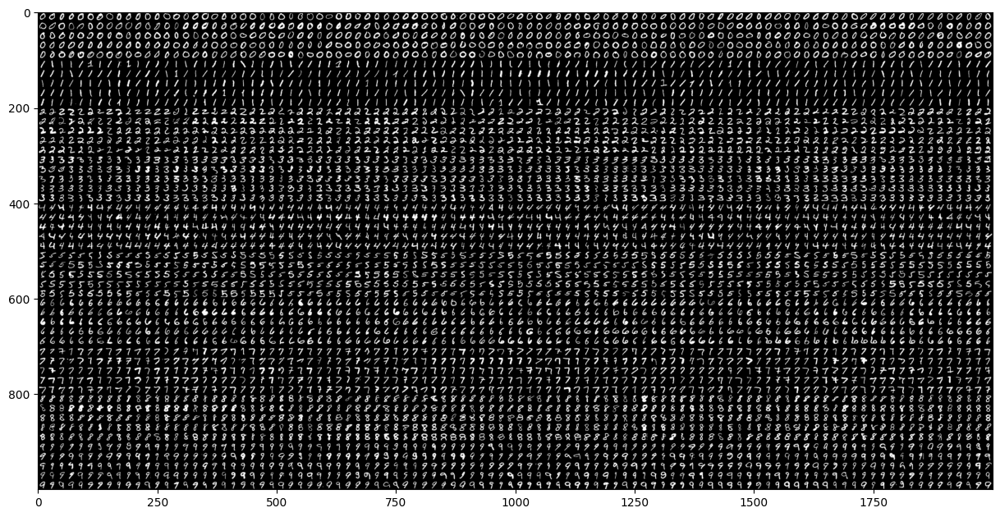

In [14]:
img = cv2.imread('dataset/digits.png', 0)
print(img.shape)
plt.figure(figsize=[15,30])
plt.imshow(img, cmap='gray')

## <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">بریدن اعداد از تصویر بزرگ حاوی تمامی اعداد</div>

In [15]:
cells = [(np.hsplit(row,100)) for row in np.vsplit(img,50)]
cells

[[array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
            0,   0,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
            0,   0,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   9,  33,
            9,   0,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  41, 177, 249,
          178,  29,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,  33, 198, 255, 240,
          255, 107,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   1,  70, 199, 255, 255, 197,
          154, 253,  98,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,  45, 238, 255, 205, 224, 222,
           83, 224, 128,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,  25, 202, 255, 193,  40,  99,  54,
            0, 190, 197,  16,   0,   0,   0],
         [  0,   0,   0,   0,   

In [18]:
cells = np.array(cells)
cells.shape

(50, 100, 20, 20)

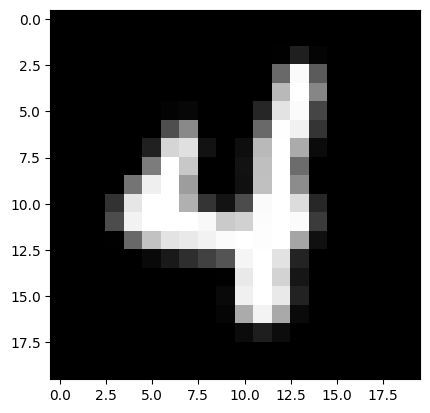

In [24]:
plt.imshow(cells[22,22,:,:],cmap="gray")

### train and test split

In [29]:
train = cells[:,:50].reshape(-1,400).astype(np.float32)
test = cells[:,50:100].reshape(-1,400).astype(np.float32)
print(train.shape)
print(test.shape)

(2500, 400)
(2500, 400)


### labels

In [30]:
k = np.arange(10)
train_label = np.repeat(k,250)[:,np.newaxis]
test_label = train_label.copy()

### train model

In [31]:
knn = cv2.ml.KNearest_create()
knn.train(train, cv2.ml.ROW_SAMPLE, train_label)

True

### result

In [33]:
ret,result,neighbours,dist = knn.findNearest(test,k=5)
# Now we check the accuracy of classification
# For that, compare the result with test_labels and check which are wrong
matches = result==test_label
correct = np.count_nonzero(matches)
accuracy = correct*100.0/result.size
print( accuracy )

91.76


https://docs.opencv.org/3.4/d8/d4b/tutorial_py_knn_opencv.html

## English-Alphabet-classification-UCI-dataset

<h1><center><div style="direction:rtl;font-family:B Lotus, B Nazanin, Tahoma">طبقه بندی حروف انگلیسی</div></center></h1>

In [35]:
import numpy as np
import cv2

[Dataset from UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/Letter+Recognition)

In [36]:
# Load the data and convert the letters to numbers
data= np.loadtxt('dataset/letter-recognition.data', dtype= 'float32', delimiter = ',',
                    converters= {0: lambda ch: ord(ch)-ord('A')})
data.shape

(20000, 17)

#### train test split

In [37]:
# Split the dataset in two, with 10000 samples each for training and test sets
train, test = np.vsplit(data,2)
print(train.shape)
print(test.shape)

(10000, 17)
(10000, 17)


In [38]:
y_train = train[:,:1]
X_train = train[:,1:]
print(X_train.shape)
print(y_train.shape)

(10000, 16)
(10000, 1)


In [39]:
y_test = test[:,:1]
X_test = test[:,1:]
print(X_test.shape)
print(y_test.shape)

(10000, 16)
(10000, 1)


#### or 

In [40]:
# Split trainData and testData into features and responses
y_train, X_train = np.hsplit(train,[1])
y_test, X_test = np.hsplit(test,[1])

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(10000, 16)
(10000, 1)
(10000, 16)
(10000, 1)


### model

In [41]:
# Initiate the kNN, classify, measure accuracy
knn = cv2.ml.KNearest_create()
knn.train(X_train, cv2.ml.ROW_SAMPLE, y_train)

True

In [42]:
ret, result, neighbours, dist = knn.findNearest(X_test, k=5)
# Now we check the accuracy of classification
matches = result==y_test
correct = np.count_nonzero(matches)
accuracy = correct*100.0/result.size
print( accuracy )

93.06


# hog feature for machine learning

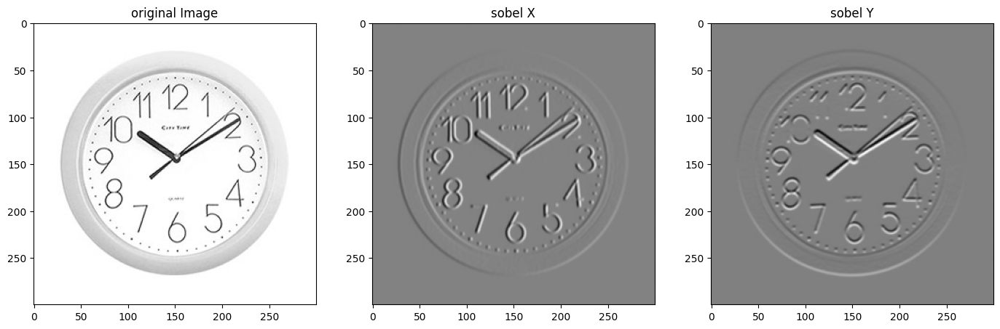

In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

gray_img = cv2.imread('images/clock.jpg', 0)
gray_blur = cv2.blur(gray_img, (3,3))


# 3x3 Sobel filters for edge detection
sobel_x = np.array([[ -1, 0, 1], 
                   [ -2, 0, 2], 
                   [ -1, 0, 1]])


sobel_y = np.array([[ -1, -2, -1], 
                   [ 0, 0, 0], 
                   [ 1, 2, 1]])


# apply Sobel edge detection
edges_x = cv2.filter2D(gray_blur, cv2.CV_32F, sobel_x)  
edges_y = cv2.filter2D(gray_blur, cv2.CV_32F, sobel_y)

# Show result
plt.figure(figsize=[17,8])
plt.subplot(131);plt.imshow(gray_img, cmap='gray');plt.title("original Image");
plt.subplot(132);plt.imshow(edges_x, cmap='gray');plt.title("sobel X");
plt.subplot(133);plt.imshow(edges_y, cmap='gray');plt.title("sobel Y");

The function ``phase`` calculates the rotation angle of each 2D vector that is formed from the corresponding elements of x and y : 

$$\texttt{angle} (I) = \texttt{atan2} ( \texttt{y} (I), \texttt{x} (I))$$

[Opencv Doc](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#ga9db9ca9b4d81c3bde5677b8f64dc0137)

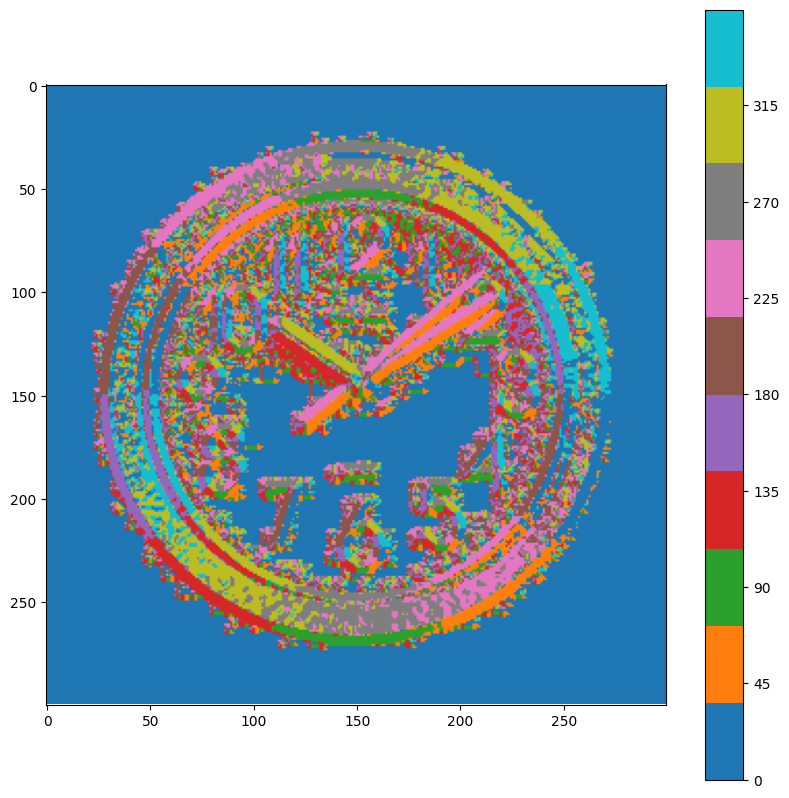

In [45]:
orien = cv2.phase(np.array(edges_x,np.float32),np.array(edges_y,np.float32),angleInDegrees=True)
plt.figure(figsize=[10,10])
bounds = np.arange(0, 360, 45)
plt.imshow(orien, cmap='tab10'),plt.colorbar(ticks= bounds),plt.show();

# calssification with hog feature

# <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">طبقه‌بندی با استخراج ویژگی با HOG</div>
### <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">لود کتابخانه‌های مورد نیاز</div>

In [46]:
import cv2
import numpy as np

In [47]:
def split2d(img, cell_size, flatten=True):
    h, w = img.shape[:2]
    sx, sy = cell_size
    cells = [np.hsplit(row, w//sx) for row in np.vsplit(img, h//sy)]
    cells = np.array(cells)
    if flatten:
        cells = cells.reshape(-1, sy, sx)
    return cells

def load_digits(file_name):
    digits_img = cv2.imread(file_name, 0)
    digits = split2d(digits_img, (20, 20))
    labels = np.repeat(np.arange(10), len(digits)/10)
    return digits, labels

digits, labels = load_digits('dataset/digits.png')
print(digits.shape)
print(labels.shape)

(5000, 20, 20)
(5000,)


### shuffle

### <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">بر زدن مجموعه داده (shuffle کردن)</div>

In [48]:
rand = np.random.RandomState(10)
shuffle = rand.permutation(len(digits))
digits, labels = digits[shuffle], labels[shuffle]

### <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">ایجاد شئ HOG برای استخراج ویژگی</div>

In [49]:
winSize = (20,20)
blockSize = (8,8)
blockStride = (4,4)
cellSize = (8,8)
nbins = 9
derivAperture = 1
winSigma = -1.
histogramNormType = 0
L2HysThreshold = 0.2
gammaCorrection = 1
nlevels = 64
signedGradient = True

hog = cv2.HOGDescriptor(winSize,blockSize,blockStride,cellSize,nbins,derivAperture,winSigma,histogramNormType,L2HysThreshold,gammaCorrection,nlevels, signedGradient)

In [50]:
hog_descriptors = []
for img in digits:
    hog_descriptors.append(hog.compute(img))
hog_descriptors = np.squeeze(hog_descriptors)
hog_descriptors.shape

(5000, 144)

### train and test split

In [51]:
train_n=int(0.9*len(hog_descriptors))
digits_train, digits_test = np.split(digits, [train_n])
hog_descriptors_train, hog_descriptors_test = np.split(hog_descriptors, [train_n])
labels_train, labels_test = np.split(labels, [train_n])

### SVM

### <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">ایجاد یک طبقه‌بند - در اینجا SVM</div>

In [52]:
C=12.5
gamma=0.50625
model = cv2.ml.SVM_create()
model.setGamma(gamma)
model.setC(C)
model.setKernel(cv2.ml.SVM_RBF)
model.setType(cv2.ml.SVM_C_SVC)

In [53]:
model.train(hog_descriptors_train, cv2.ml.ROW_SAMPLE, labels_train)

True

In [54]:
predictions = model.predict(hog_descriptors_test)[1].ravel()
accuracy = (labels_test == predictions).mean()
print('Percentage Accuracy: %.2f %%' % (accuracy*100))

Percentage Accuracy: 98.60 %


# you can use to rotate digit
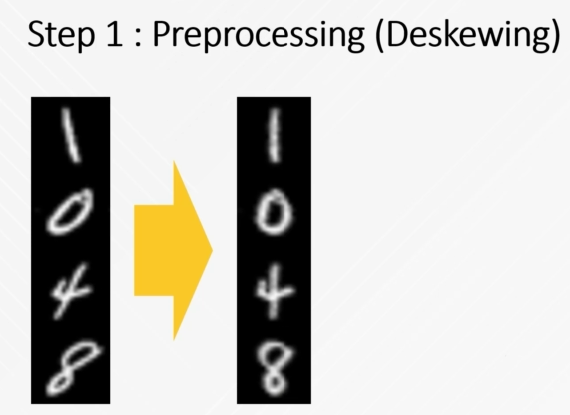

In [ ]:
"""
 def deskew(_img):
    image = io.imread(_img)
    grayscale = rgb2gray(image)
    angle = determine_skew(grayscale)
    rotated = rotate(image, angle, resize=True) * 255
    return rotated.astype(np.uint8)
"""


Source and More complete example:
https://github.com/spmallick/learnopencv/blob/master/digits-classification/train_digits.py

# detection with hog

Original Paper: [Histograms of Oriented Gradients for Human Detection](http://lear.inrialpes.fr/people/triggs/pubs/Dalal-cvpr05.pdf)

Original Dataset: [INRIA Person](http://pascal.inrialpes.fr/data/human/)

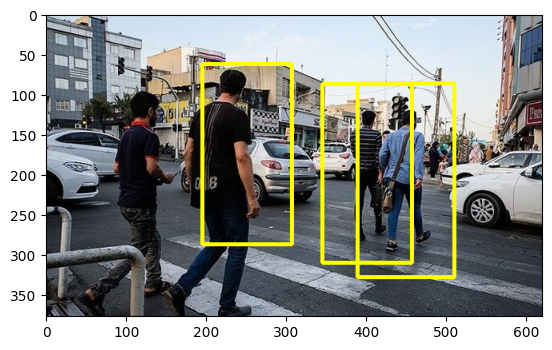

In [63]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
image = cv2.imread('images/pedestrian.jpg')

(bounding_boxes, weights) = hog.detectMultiScale(image, 
                                               winStride=(4, 4),
                                               scale=1.05)

# Draw bounding boxes on the image
for (x, y, w, h) in bounding_boxes: 
    cv2.rectangle(image, 
                  (x, y),  
                  (x + w, y + h),  
                  (0, 255, 255), 
                   4)
    
plt.imshow(image[...,::-1])
    

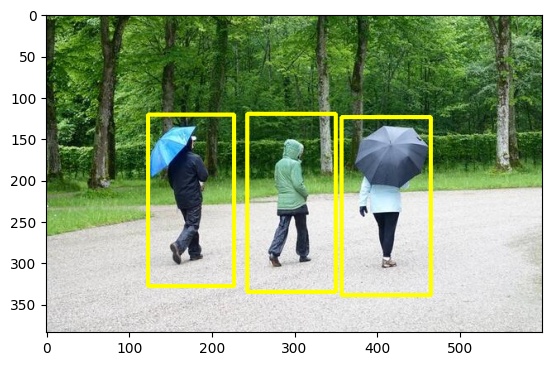

In [58]:
import cv2
import matplotlib.pyplot as plt

# Create a HOGDescriptor object
hog = cv2.HOGDescriptor()

# Initialize the People Detector
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# Load an image
image = cv2.imread('images/pedestrians_2.jpg')
(bounding_boxes, weights) = hog.detectMultiScale(image)

# Draw bounding boxes on the image
for (x, y, w, h) in bounding_boxes: 
    cv2.rectangle(image, 
                  (x, y),  
                  (x + w, y + h),  
                  (0, 255, 255), 
                   4)

plt.imshow(image[...,::-1])

<div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">معمولا پارامتر اختیاری scale را مقداری بین 1.01 تا 1.5 تنظیم میکنیم که این مقدار بسیار روی سرعت الگوریتم تاثیر می‌گذارد!</div>

In [64]:
%timeit hog.detectMultiScale(image, scale=1.01)

67.9 ms ± 4.83 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [65]:
%timeit hog.detectMultiScale(image, scale=1.5)

19.1 ms ± 2.04 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


for more information you can read this blog post:
    https://pyimagesearch.com/2015/11/16/hog-detectmultiscale-parameters-explained/

# voila jones Face-and-eye-detection-haarcascade.ipynb

# <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">تشخیص چهره و چشم با الگوریتم haarcascade</div>

<div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">برای دانلود مدل‌های از قبل آموزش دیده شده به آدرس زیر مراجعه کنید:</div>

https://github.com/opencv/opencv/tree/4.x/data/haarcascades

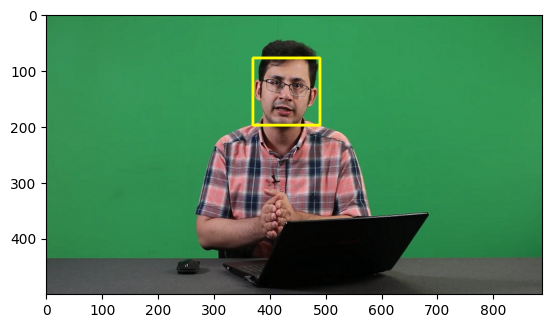

In [ ]:
import cv2
import matplotlib.pyplot as plt

face_cascade = cv2.CascadeClassifier()
face_cascade.load("xml/haarcascade_frontalface_alt.xml")

image = cv2.imread('images/green-sccreen.png')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray = cv2.equalizeHist(gray)

faces = face_cascade.detectMultiScale(gray)

for (x,y,w,h) in faces:
    cv2.rectangle(image, (x,y), (x+w,y+h), (0,255,255), 3)

plt.imshow(image[...,::-1])

### eyes detect

### <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">پیدا کردن چشم‌ها در محدوده‌ی چهره</div>

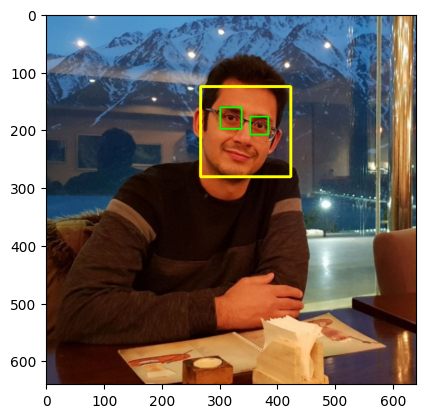

In [ ]:
import cv2
import matplotlib.pyplot as plt

face_cascade = cv2.CascadeClassifier()
eyes_cascade = cv2.CascadeClassifier()
face_cascade.load('xml/haarcascade_frontalface_alt.xml')
eyes_cascade.load('xml/haarcascade_eye.xml')


image = cv2.imread('images/akhavan.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray = cv2.equalizeHist(gray)

faces = face_cascade.detectMultiScale(gray)

for (x,y,w,h) in faces:
    cv2.rectangle(image, (x,y), (x+w,y+h), (0,255,255), 3)
    roi_gray = gray[y:y+h, x:x+w]
    eyes = eyes_cascade.detectMultiScale(roi_gray)
    for (ex,ey,ew,eh) in eyes:
        cv2.rectangle(image,(x+ex,y+ey),(x+ex+ew,y+ey+eh),(0,255,0),2)
    
plt.imshow(image[...,::-1]);

### webcam detect

### <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">نمایش چهره در تصویر وبکم</div>

In [ ]:
import cv2

face_cascade = cv2.CascadeClassifier()
eyes_cascade = cv2.CascadeClassifier()
face_cascade.load('xml/haarcascade_frontalface_alt.xml')
eyes_cascade.load('xml/haarcascade_eye.xml')

def detectAndDisplay(frame):
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    frame_gray = cv2.equalizeHist(frame_gray)
    faces = face_cascade.detectMultiScale(frame_gray)
    for (x,y,w,h) in faces:
        center = (x + w//2, y + h//2)
        frame = cv2.ellipse(frame, center, (w//2, h//2), 0, 0, 360, (255, 0, 255), 4)
        faceROI = frame_gray[y:y+h,x:x+w]
        #-- In each face, detect eyes
        eyes = eyes_cascade.detectMultiScale(faceROI)
        for (x2,y2,w2,h2) in eyes:
            eye_center = (x + x2 + w2//2, y + y2 + h2//2)
            radius = int(round((w2 + h2)*0.25))
            frame = cv2.circle(frame, eye_center, radius, (255, 0, 0 ), 4)
    cv2.imshow('Face detection', frame)

    
    
cap = cv2.VideoCapture(0)
if not cap.isOpened:
    print('--(!)Error opening video capture')
    exit(0)
while True:
    ret, frame = cap.read()
    if frame is None:
        print('--(!) No captured frame -- Break!')
        break
    detectAndDisplay(frame)
    if cv2.waitKey(1) == 27:
        break
cap.release()
cv2.destroyAllWindows() 